In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score

In [2]:
df = pd.read_csv('/content/winequality-red.csv')

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 78.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=28ed5eb1e0de7af20214cfb45dbcb2a7f3d73d891bbf136e85ff5467d3fb1704
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [5]:
from ydata_profiling import ProfileReport

In [6]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [8]:
x = df.drop(columns = 'quality')
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [9]:
y = df['quality']
y

,quality
0,5
1,5
2,5
3,6
4,5
...,...
1594,5
1595,6
1596,6
1597,5


In [10]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.25, random_state=300)

In [11]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1591,5.4,0.740,0.09,1.70,0.089,16.0,26.0,0.99402,3.67,0.56,11.6
537,8.1,0.825,0.24,2.10,0.084,5.0,13.0,0.99720,3.37,0.77,10.7
1053,8.3,0.330,0.42,2.30,0.070,9.0,20.0,0.99426,3.38,0.77,12.7
651,9.8,0.880,0.25,2.50,0.104,35.0,155.0,1.00100,3.41,0.67,11.2
900,8.9,0.310,0.36,2.60,0.056,10.0,39.0,0.99562,3.40,0.69,11.8
...,...,...,...,...,...,...,...,...,...,...,...
1033,7.5,0.570,0.08,2.60,0.089,14.0,27.0,0.99592,3.30,0.59,10.4
1002,9.1,0.290,0.33,2.05,0.063,13.0,27.0,0.99516,3.26,0.84,11.7
917,6.8,0.410,0.31,8.80,0.084,26.0,45.0,0.99824,3.38,0.64,10.1
481,9.4,0.300,0.56,2.80,0.080,6.0,17.0,0.99640,3.15,0.92,11.7


In [12]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
755,7.8,0.910,0.07,1.90,0.058,22.0,47.0,0.99525,3.51,0.43,10.70
999,6.4,0.690,0.00,1.65,0.055,7.0,12.0,0.99162,3.47,0.53,12.90
1521,6.9,0.480,0.20,1.90,0.082,9.0,23.0,0.99585,3.39,0.43,9.05
24,6.9,0.400,0.14,2.40,0.085,21.0,40.0,0.99680,3.43,0.63,9.70
47,8.7,0.290,0.52,1.60,0.113,12.0,37.0,0.99690,3.25,0.58,9.50
...,...,...,...,...,...,...,...,...,...,...,...
258,7.7,0.410,0.76,1.80,0.611,8.0,45.0,0.99680,3.06,1.26,9.40
317,9.6,0.770,0.12,2.90,0.082,30.0,74.0,0.99865,3.30,0.64,10.40
430,10.5,0.240,0.47,2.10,0.066,6.0,24.0,0.99780,3.15,0.90,11.00
1483,8.1,0.330,0.44,1.50,0.042,6.0,12.0,0.99542,3.35,0.61,10.70


In [13]:
model_gini = DecisionTreeClassifier()

model_gini.fit(x_train, y_train)


DecisionTreeClassifier()

In [14]:
model_gini.predict(x_test)

array([5, 5, 5, 6, 6, 5, 5, 5, 5, 6, 4, 5, 6, 6, 5, 6, 6, 6, 5, 5, 5, 7,
       5, 6, 7, 6, 5, 5, 6, 5, 6, 7, 6, 5, 7, 6, 5, 6, 5, 5, 5, 5, 6, 6,
       6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 7, 6, 6, 6, 6, 7, 6, 7, 6, 6,
       7, 5, 5, 6, 6, 5, 6, 7, 6, 4, 8, 5, 6, 5, 5, 6, 6, 6, 7, 6, 5, 6,
       5, 5, 5, 5, 5, 7, 5, 5, 7, 6, 5, 7, 7, 5, 6, 6, 6, 7, 5, 5, 5, 7,
       4, 5, 6, 6, 5, 6, 6, 5, 6, 4, 6, 5, 6, 7, 6, 7, 7, 5, 6, 6, 5, 5,
       5, 4, 6, 6, 6, 6, 6, 5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 7, 7, 5,
       6, 6, 7, 4, 4, 5, 5, 5, 5, 5, 6, 6, 6, 5, 6, 6, 7, 5, 6, 6, 6, 7,
       5, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 5, 5, 5, 5, 7, 4, 7, 6, 6, 6,
       6, 5, 5, 5, 5, 5, 6, 7, 5, 6, 5, 5, 4, 7, 7, 5, 5, 6, 5, 7, 5, 5,
       5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 7, 6, 5, 6, 6, 6, 6, 5, 5,
       6, 6, 7, 6, 5, 5, 5, 6, 7, 5, 6, 6, 4, 7, 7, 6, 4, 7, 6, 6, 5, 4,
       6, 7, 6, 5, 6, 4, 5, 6, 6, 7, 7, 5, 5, 6, 5, 8, 7, 5, 5, 6, 5, 5,
       5, 5, 6, 5, 6, 5, 6, 6, 7, 6, 5, 7, 5, 6, 4,

In [15]:
model_gini.score(x_test, y_test)

0.595

In [16]:
model_en = DecisionTreeClassifier(criterion="entropy")
model_en.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy')

In [17]:
model_en.score(x_test, y_test)

0.615

In [18]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

[Text(0.4967927631578947, 0.98, 'x[10] <= 10.15\ngini = 0.638\nsamples = 1199\nvalue = [5, 41, 512, 487, 139, 15]'),
 Text(0.26513157894736844, 0.94, 'x[1] <= 0.548\ngini = 0.506\nsamples = 594\nvalue = [3.0, 20.0, 374.0, 184.0, 12.0, 1.0]'),
 Text(0.3809621710526316, 0.96, 'True  '),
 Text(0.15699760765550239, 0.9, 'x[6] <= 60.5\ngini = 0.554\nsamples = 264\nvalue = [0, 7, 134, 114, 8, 1]'),
 Text(0.07476076555023924, 0.86, 'x[9] <= 0.585\ngini = 0.56\nsamples = 178\nvalue = [0, 5, 68, 96, 8, 1]'),
 Text(0.0354066985645933, 0.82, 'x[5] <= 8.5\ngini = 0.528\nsamples = 55\nvalue = [0, 4, 33, 18, 0, 0]'),
 Text(0.019138755980861243, 0.78, 'x[10] <= 9.85\ngini = 0.265\nsamples = 20\nvalue = [0, 1, 17, 2, 0, 0]'),
 Text(0.011483253588516746, 0.74, 'x[9] <= 0.435\ngini = 0.105\nsamples = 18\nvalue = [0, 0, 17, 1, 0, 0]'),
 Text(0.007655502392344498, 0.7, 'x[4] <= 0.079\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(0.003827751196172249, 0.66, 'gini = 0.0\nsamples = 1\nvalue =

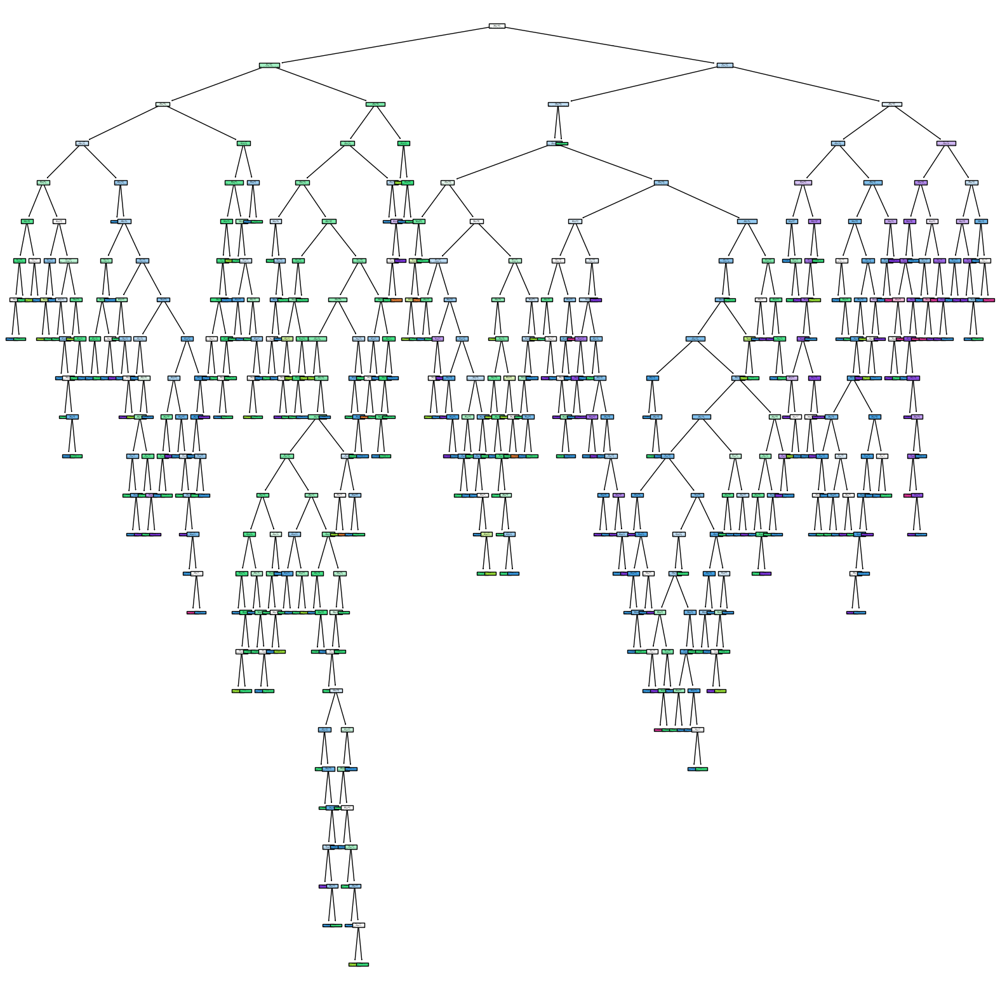

In [19]:
plt.figure(figsize=(20,20))
tree.plot_tree(model_gini, filled=True)

In [20]:
 df1=df.head(200)

In [21]:
x1 = df1.drop(columns='quality')

In [22]:
y1 = df1.quality

In [23]:
model1 = DecisionTreeClassifier()
model1.fit(x1,y1)

DecisionTreeClassifier()

[Text(0.613031914893617, 0.9615384615384616, 'total sulfur dioxide <= 63.5\ngini = 0.504\nsamples = 200\nvalue = [12.0, 131.0, 50.0, 7.0]\nclass = 5'),
 Text(0.42819148936170215, 0.8846153846153846, 'alcohol <= 9.75\ngini = 0.574\nsamples = 122\nvalue = [8, 67, 42, 5]\nclass = 5'),
 Text(0.5206117021276595, 0.9230769230769231, 'True  '),
 Text(0.2925531914893617, 0.8076923076923077, 'volatile acidity <= 0.653\ngini = 0.49\nsamples = 75\nvalue = [6.0, 51.0, 15.0, 3.0]\nclass = 5'),
 Text(0.1595744680851064, 0.7307692307692307, 'density <= 0.997\ngini = 0.549\nsamples = 53\nvalue = [3, 32, 15, 3]\nclass = 5'),
 Text(0.0851063829787234, 0.6538461538461539, 'citric acid <= 0.05\ngini = 0.278\nsamples = 25\nvalue = [1, 21, 3, 0]\nclass = 5'),
 Text(0.0425531914893617, 0.5769230769230769, 'free sulfur dioxide <= 12.5\ngini = 0.625\nsamples = 4\nvalue = [1, 1, 2, 0]\nclass = 6'),
 Text(0.02127659574468085, 0.5, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 2, 0]\nclass = 6'),
 Text(0.0638297872340

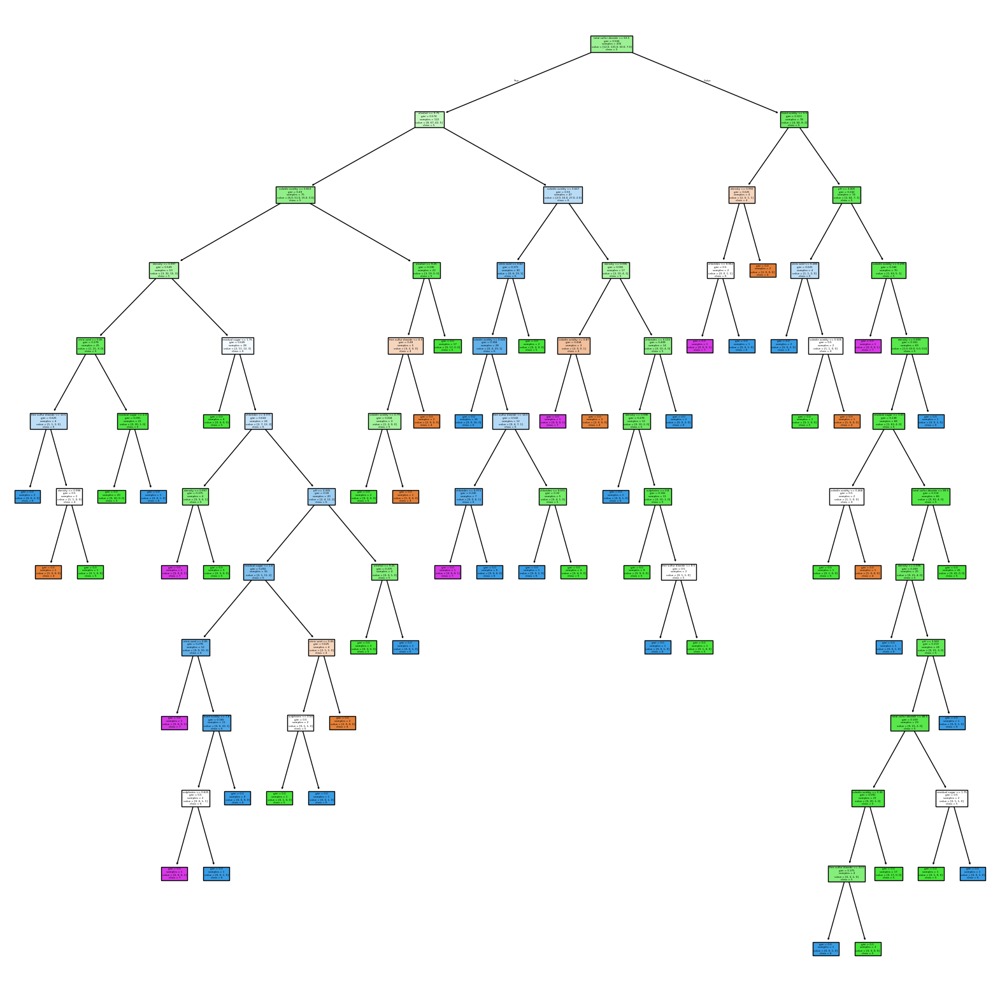

In [24]:
plt.figure(figsize=(20,20))
tree.plot_tree(model1, filled=True, class_names=[str(i) for i in set(y1)], feature_names=x1.columns)

on the parent node, it is able to find out min gini impurity for the second col
then after seperation, the available data which is less than 0.355 will go towards the left node and data greater than 0.355 will go towards the right node

4 samples/data has less value than 0.355
26 samples/data has more value than 0.355


In [25]:
set(y1)

{4, 5, 6, 7}

1. here, the values in the tree [1,21,5,3] show the no.of values
taken from each classes. eg: 1value taken from class 4, 21values taken fro class 5 etc

2. the total sum of values always equals to the samples

In [26]:
model1.score(x1, y1)

1.0

In [27]:
path = model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path.ccp_alphas
ccp_alpha

array([0.        , 0.00454545, 0.00454545, 0.00456522, 0.005     ,
       0.005     , 0.005     , 0.005     , 0.005     , 0.00591272,
       0.006     , 0.00666667, 0.0075    , 0.0075    , 0.0075    ,
       0.0075    , 0.0075    , 0.0075    , 0.00757576, 0.00757576,
       0.008     , 0.00857143, 0.00859548, 0.00906418, 0.00952381,
       0.01020833, 0.011125  , 0.01158333, 0.01190476, 0.01252317,
       0.01277619, 0.01296429, 0.01316667, 0.01327381, 0.01390909,
       0.01417367, 0.01626688, 0.01995669, 0.02428327, 0.03431851])

In [28]:
model2 = []
for ccp in ccp_alpha:
  model = DecisionTreeClassifier(ccp_alpha=ccp)
  model.fit(x1,y1)
  model2.append(model)

1. What is ccp_alpha?:

ccp_alpha (Cost Complexity Pruning Alpha) is a regularization parameter in decision trees that controls the amount of pruning.

Higher values of ccp_alpha result in simpler trees (more pruning), while lower values result in more complex trees.
This helps in reducing overfitting.

2. What is the loop doing?:

The loop iterates over a list of different ccp_alpha values (assumed to be stored in ccp_alpha).

For each value of ccp_alpha, it trains a separate DecisionTreeClassifier.

Each trained model is stored in model2, which will contain multiple trees trained with different pruning levels.

In [29]:
model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.004545454545454546),
 DecisionTreeClassifier(ccp_alpha=0.004545454545454546),
 DecisionTreeClassifier(ccp_alpha=0.004565217391304347),
 DecisionTreeClassifier(ccp_alpha=0.005),
 DecisionTreeClassifier(ccp_alpha=0.005),
 DecisionTreeClassifier(ccp_alpha=0.005),
 DecisionTreeClassifier(ccp_alpha=0.005),
 DecisionTreeClassifier(ccp_alpha=0.005),
 DecisionTreeClassifier(ccp_alpha=0.005912723785166243),
 DecisionTreeClassifier(ccp_alpha=0.006),
 DecisionTreeClassifier(ccp_alpha=0.006666666666666666),
 DecisionTreeClassifier(ccp_alpha=0.0075),
 DecisionTreeClassifier(ccp_alpha=0.0075),
 DecisionTreeClassifier(ccp_alpha=0.007500000000000001),
 DecisionTreeClassifier(ccp_alpha=0.007500000000000001),
 DecisionTreeClassifier(ccp_alpha=0.007500000000000001),
 DecisionTreeClassifier(ccp_alpha=0.007500000000000001),
 DecisionTreeClassifier(ccp_alpha=0.007575757575757574),
 DecisionTreeClassifier(ccp_alpha=0.007575757575757574),
 Decisio

In [30]:
train_score = [i.score(x1,y1) for i in model2]
test_score = [i.score(x_test,y_test) for i in model2]

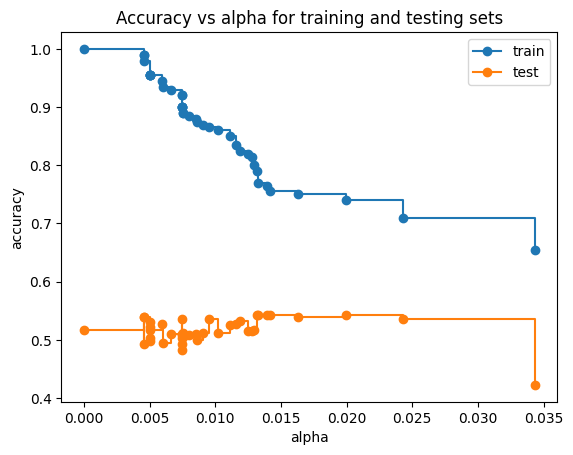

In [31]:
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test", drawstyle="steps-post")
ax.legend()
plt.show()


In [32]:
model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=.014)
model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.625, 0.9, 'x[6] <= 63.5\ngini = 0.504\nsamples = 200\nvalue = [12.0, 131.0, 50.0, 7.0]'),
 Text(0.4166666666666667, 0.7, 'x[10] <= 9.75\ngini = 0.574\nsamples = 122\nvalue = [8, 67, 42, 5]'),
 Text(0.5208333333333334, 0.8, 'True  '),
 Text(0.25, 0.5, 'x[1] <= 0.653\ngini = 0.49\nsamples = 75\nvalue = [6.0, 51.0, 15.0, 3.0]'),
 Text(0.16666666666666666, 0.3, 'x[7] <= 0.997\ngini = 0.549\nsamples = 53\nvalue = [3, 32, 15, 3]'),
 Text(0.08333333333333333, 0.1, 'gini = 0.278\nsamples = 25\nvalue = [1, 21, 3, 0]'),
 Text(0.25, 0.1, 'gini = 0.645\nsamples = 28\nvalue = [2, 11, 12, 3]'),
 Text(0.3333333333333333, 0.3, 'gini = 0.236\nsamples = 22\nvalue = [3, 19, 0, 0]'),
 Text(0.5833333333333334, 0.5, 'x[1] <= 0.647\ngini = 0.55\nsamples = 47\nvalue = [2.0, 16.0, 27.0, 2.0]'),
 Text(0.5, 0.3, 'gini = 0.371\nsamples = 30\nvalue = [0, 6, 23, 1]'),
 Text(0.6666666666666666, 0.3, 'x[7] <= 0.995\ngini = 0.581\nsamples = 17\nvalue = [2, 10, 4, 1]'),
 Text(0.5833333333333334, 0.1, 'gini = 0.

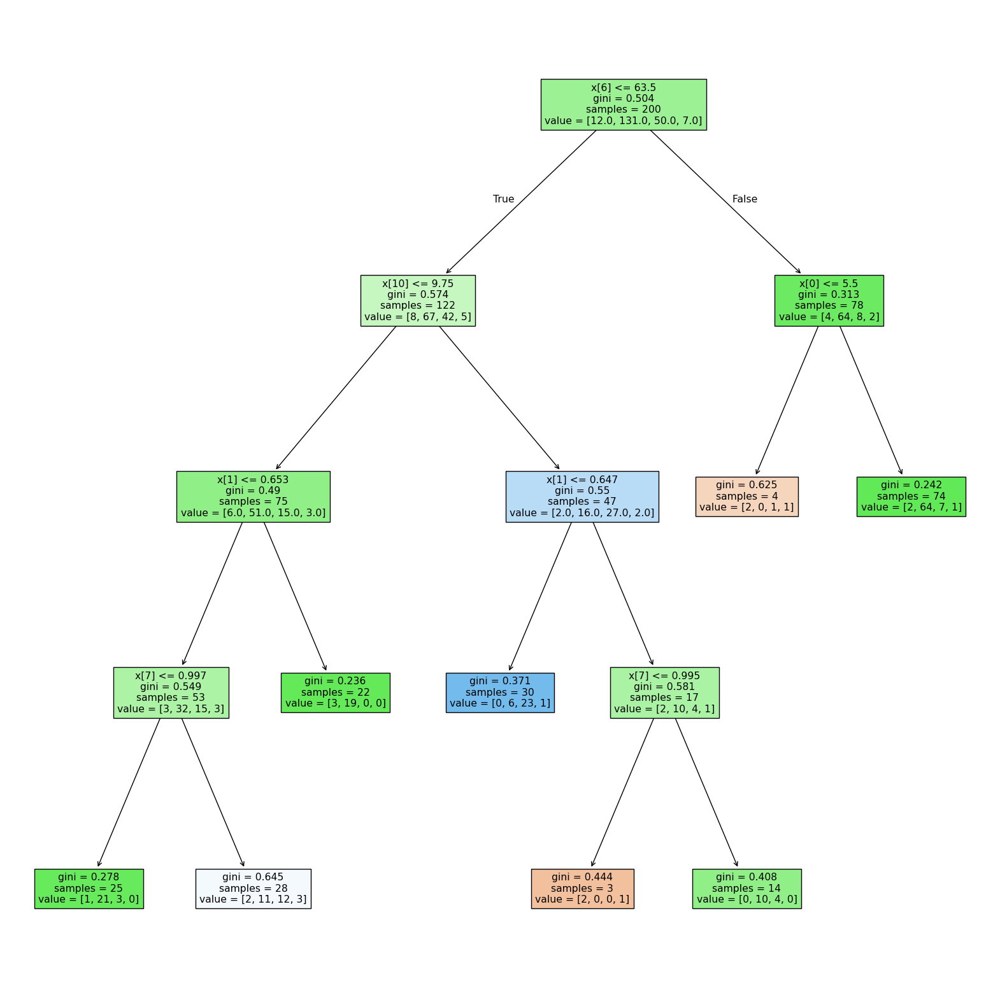

In [33]:
plt.figure(figsize=(20,20))
tree.plot_tree(model_ccp, filled=True)

In [34]:
model_ccp.score(x1,y1)

0.765

In [35]:
model_ccp.score(x_test,y_test)

0.5425

In [36]:
# Ensure model_ccp is a list containing multiple models with different ccp_alpha values
model_ccp = []
for ccp in ccp_alpha:
    model = DecisionTreeClassifier(ccp_alpha=ccp, random_state=42)
    model.fit(x1, y1)
    model_ccp.append(model)  # Append each trained model to the list

# Now, you can iterate over model_ccp to get the scores
train_score = [model.score(x1, y1) for model in model_ccp]
test_score = [model.score(x_test, y_test) for model in model_ccp]


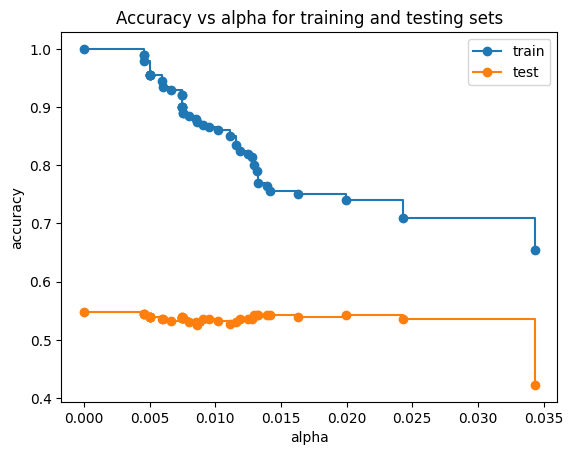

In [37]:
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test", drawstyle="steps-post")
ax.legend()
plt.show()


In [38]:
model_ccp2 = DecisionTreeClassifier(random_state=42)

In [39]:
grid_pram = {"criterion": ['gini', 'entropy'],
             "splitter": ['best', 'random'],
             "max_depth": range(2,40,1),
             "min_samples_split": range(2,10,1),
             "min_samples_leaf": range(1,10,1)
             }

In [40]:
grid_ccp = GridSearchCV(estimator=model_ccp2, param_grid=grid_pram, cv = 5, n_jobs=-1)

In [41]:
# Fit the GridSearchCV model
grid_ccp.fit(x1, y1)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [42]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 9,
 'min_samples_split': 2,
 'splitter': 'random'}

In [43]:
model_ccp3 = DecisionTreeClassifier(criterion= 'entropy',
 max_depth= 5,
 min_samples_leaf= 9,
 min_samples_split= 2,
 splitter= 'random')

In [44]:
model_ccp3.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=9,
                       splitter='random')

In [45]:
model_ccp3.score(x1,y1)

0.715

In [46]:
model_ccp3.score(x_test,y_test)

0.525

In [47]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [48]:
x = df.drop(columns=['quality'])
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [49]:
y = df.quality
y

,quality
0,5
1,5
2,5
3,6
4,5
...,...
1594,5
1595,6
1596,6
1597,5


In [57]:
print(len(x_train), len(y_train))


1279 320


In [58]:
print(len(x), len(y))


1599 1599


In [50]:
from sklearn.ensemble import BaggingClassifier

In [54]:
x_train, y_train, x_test, y_test = train_test_split(x,y,  test_size=0.2, random_state= 42)

In [55]:
bag = BaggingClassifier(DecisionTreeClassifier(), n_estimators=10)

here, n_estimators mean number of trees in a bag

In [56]:
bag.fit(x_train, y_train)

ValueError: Found input variables with inconsistent numbers of samples: [1279, 320]